In [1]:
# Import libraries and dependencies
import os
import numpy as np
import pandas as pd
import hvplot.pandas
import datetime as dt
from pathlib import Path

import panel as pn
import plotly.express as px
import matplotlib.pyplot as plt
pn.extension('plotly')

#from dotenv import load_dotenv
#load_dotenv()

%matplotlib inline

from MCForecastTools import MCSimulation


Bad key savefig.frameon in file /Users/brando/opt/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 421 ('savefig.frameon : True')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.4.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.level in file /Users/brando/opt/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 472 ('verbose.level  : silent      # one of silent, helpful, debug, debug-annoying')
You probably need to get an updated matplotlibrc file from
https://github.com/matplotlib/matplotlib/blob/v3.4.3/matplotlibrc.template
or from the matplotlib source distribution

Bad key verbose.fileo in file /Users/brando/opt/anaconda3/lib/python3.8/site-packages/matplotlib/mpl-data/stylelib/_classic_test.mplstyle, line 473 ('verbose.fileo  : sys.stdout  # a log filename, sys.stdout or sys.stderr')
You probably 

In [2]:
os.getcwd()

'/Users/brando/Desktop/Project-1'

### Read and process SPY ETF Price Data

In [3]:
# Reading SPY price history
spy_price_csv = Path("SPY.csv")
spy_price = pd.read_csv(
    spy_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
spy_price = spy_price.sort_index()
spy_price = spy_price.dropna()
spy_price["Close"] = spy_price["Close"].astype("float")
spy_price = spy_price.rename(columns={"Close": "close"})
spy_price.head(2)

,close
Date,
2015-01-02 16:00:00,205.43
2015-01-05 16:00:00,201.76


In [4]:
# Reset index in SPY data
spy_price_close =  spy_price.reset_index()
spy_price_close["Date"] = spy_price_close["Date"].dt.date
spy_price_close.head(2)

,Date,close
0,2015-01-02,205.43
1,2015-01-05,201.76


In [5]:
#Prep SPY prices for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

spy_price_MC = spy_price_close
spy_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("SPY", "close")
]
spy_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
spy_price_MC = spy_price_MC.set_index(("Date"))
spy_price_MC 

,SPY
,close
Date,
2015-01-02,205.43
2015-01-05,201.76
2015-01-06,199.82
2015-01-07,202.31
2015-01-08,205.90
...,...
2021-10-25,455.55
2021-10-26,455.96


### Read and process Bitcoin price data

In [6]:
# Reading BTC price history

btc_price_csv = Path("Bitcoin2.csv")
btc_price = pd.read_csv(
    btc_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
btc_price = btc_price.sort_index()
btc_price = btc_price.dropna()
btc_price["Close"] = btc_price["Close"].astype("float")
btc_price = btc_price.rename(columns={"Close": "close"})
btc_price.head(2)

,close
Date,
2015-11-19 23:58:00,326.41
2015-11-20 23:58:00,322.39


In [7]:
# Reset index in BTC data
btc_price_close =  btc_price.reset_index()
btc_price_close["Date"] = btc_price_close["Date"].dt.date
btc_price_close.head(2)

,Date,close
0,2015-11-19,326.41
1,2015-11-20,322.39


In [8]:
#Prep BTC prices for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

btc_price_MC = btc_price_close
btc_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("BTC", "close")
]
btc_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
btc_price_MC = btc_price_MC.set_index(("Date"))
btc_price_MC

,BTC
,close
Date,
2015-11-19,326.41
2015-11-20,322.39
2015-11-21,327.00
2015-11-22,323.71
2015-11-23,323.00
...,...
2021-10-27,58455.40
2021-10-28,60608.10


### Read and process Ethereum price data

In [9]:
# Reading Ethereum prices from csv file
eth_price_csv = Path("Ethereum.csv")
eth_price = pd.read_csv(
    eth_price_csv, index_col="Date", infer_datetime_format=True, parse_dates=True)
eth_price = eth_price.sort_index()
eth_price = eth_price.dropna()
eth_price["Close"] = eth_price["Close"].astype("float")
eth_price = eth_price.rename(columns={"Close": "close"})
eth_price.head(5)

,close
Date,
2016-10-14 23:58:00,11.92
2016-10-15 23:58:00,11.95
2016-10-16 23:58:00,11.95
2016-10-17 23:58:00,11.96
2016-10-18 23:58:00,12.54


In [10]:
#Reset ethereum data index
eth_price_close = eth_price.reset_index()
eth_price_close["Date"] = eth_price_close["Date"].dt.date
eth_price_close.head(2)

,Date,close
0,2016-10-14,11.92
1,2016-10-15,11.95


In [11]:
#Prep ETH price for input to Monte Carlo function (Multi-index, 2 level for compatability with MC function)

eth_price_MC = eth_price_close
eth_price_MC.set_index("Date", drop=True)
newcols = [
    ("Date", ""), 
    ("ETH", "close")
]
eth_price_MC.columns = pd.MultiIndex.from_tuples(newcols)
eth_price_MC = eth_price_MC.set_index(("Date"))
eth_price_MC 

,ETH
,close
Date,
2016-10-14,11.92
2016-10-15,11.95
2016-10-16,11.95
2016-10-17,11.96
2016-10-18,12.54
...,...
2021-10-27,3925.44
2021-10-28,4288.26


### Compute Daily Returns

In [12]:
# Get SPY Daily Returns

spy_returns = spy_price.pct_change().dropna()
spy_returns.head(5)

,close
Date,
2015-01-05 16:00:00,-0.017865
2015-01-06 16:00:00,-0.009615
2015-01-07 16:00:00,0.012461
2015-01-08 16:00:00,0.017745
2015-01-09 16:00:00,-0.008014


In [13]:
btc_returns = btc_price.pct_change().dropna()
btc_returns.head(5)

,close
Date,
2015-11-20 23:58:00,-0.012316
2015-11-21 23:58:00,0.014299
2015-11-22 23:58:00,-0.010061
2015-11-23 23:58:00,-0.002193
2015-11-24 23:58:00,-0.006192


In [14]:
# Get Ethereum Daily Returns

eth_returns = eth_price.pct_change().dropna().copy()
eth_returns.head(5)

,close
Date,
2016-10-15 23:58:00,0.002517
2016-10-16 23:58:00,0.000000
2016-10-17 23:58:00,0.000837
2016-10-18 23:58:00,0.048495
2016-10-19 23:58:00,-0.042265


## Plot Daily Returns

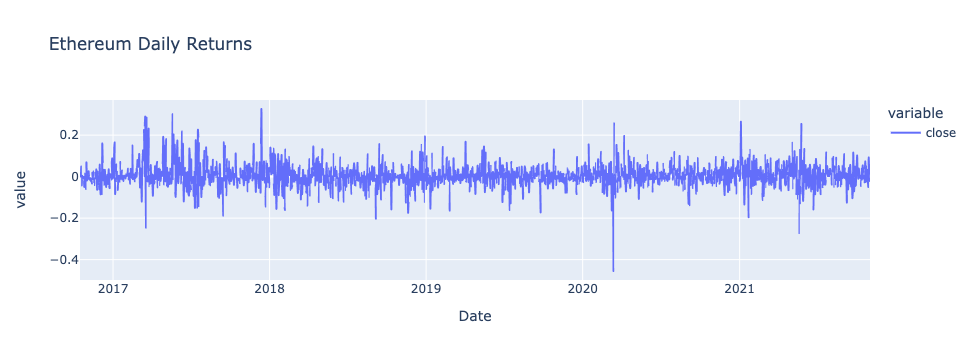

In [15]:
# Plot Ethereum Daily Returns using plotly


px.line(eth_returns, title="Ethereum Daily Returns")

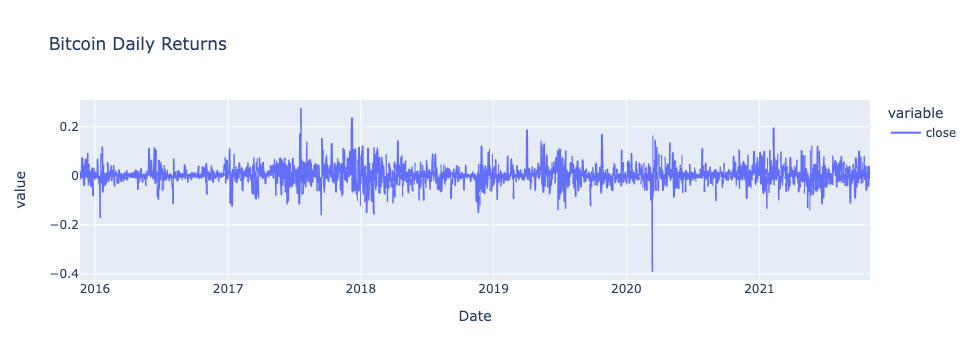

In [16]:
# Plot Bitcoin Daily Returns using plotly


px.line(btc_returns, title="Bitcoin Daily Returns")

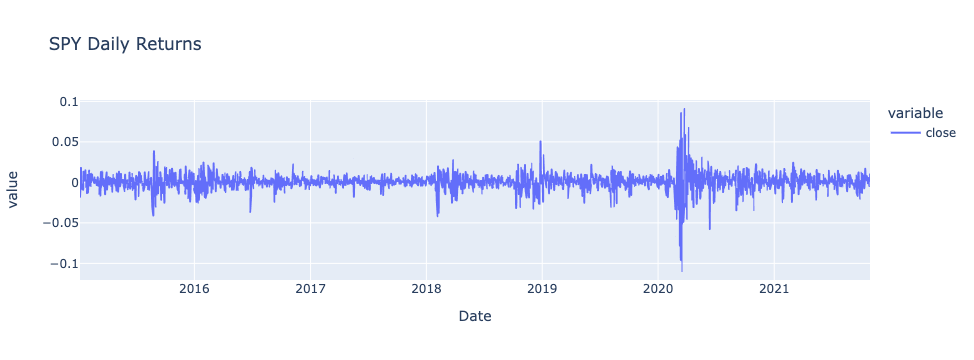

In [17]:
#Plot SPY Daily Returns using plotly

px.line(spy_returns, title="SPY Daily Returns")

### Prepping data for pandas dataframe concatenation

In [18]:
# Prepping SPY data for pandas dataframe Concatenation

spy_returns_1 = spy_returns.rename(columns={"close": "SPY"})
spy_returns_1 = spy_returns_1.reset_index()
spy_returns_1["Date"] = spy_returns_1["Date"].dt.date
spy_returns_1 = spy_returns_1.set_index("Date")
spy_returns_1.head(2)

,SPY
Date,
2015-01-05,-0.017865
2015-01-06,-0.009615


In [19]:
# Prepping BTC data for pandas dataframe Concatenation

btc_returns_1 = btc_returns.rename(columns={"close": "BTC"})
btc_returns_1 = btc_returns_1.reset_index()
btc_returns_1["Date"] = btc_returns_1["Date"].dt.date
btc_returns_1 = btc_returns_1.set_index("Date")
btc_returns_1.head(2)

,BTC
Date,
2015-11-20,-0.012316
2015-11-21,0.014299


In [20]:
# Prepping Ethereum data for pandas dataframe Concatenation

eth_returns_1 = eth_returns.rename(columns={"close": "Ethereum"})
eth_returns_1 = eth_returns_1.reset_index()
eth_returns_1["Date"] = eth_returns_1["Date"].dt.date
eth_returns_1 = eth_returns_1.set_index("Date")
eth_returns_1.head(3)

,Ethereum
Date,
2016-10-15,0.002517
2016-10-16,0.000000
2016-10-17,0.000837


In [21]:
#BLOCK of code used to Concatenate daily return data :  SPY, Ethereum, Bitcoin


spy_eth_btc_combo_returns = pd.concat([eth_returns_1, btc_returns_1, spy_returns_1], axis=1, join="outer")
spy_eth_btc_combo_returns.dropna(inplace=True)
spy_eth_btc_combo_returns.head(5)


,Ethereum,BTC,SPY
Date,,,
2016-10-17,0.000837,-0.003676,-0.003472
2016-10-18,0.048495,-0.006958,0.006262
2016-10-19,-0.042265,-0.008377,0.002667
2016-10-20,0.004163,-0.002763,-0.001867
2016-10-21,-0.000829,0.004426,0.000468


In [22]:
#BLOCK of code used to Concatenate daily return data :  SPY, Ethereum


spy_eth_combo_returns = pd.concat([eth_returns_1, spy_returns_1], axis=1, join="outer")
spy_eth_combo_returns.dropna(inplace=True)
spy_eth_combo_returns.head(5)


,Ethereum,SPY
Date,,
2016-10-17,0.000837,-0.003472
2016-10-18,0.048495,0.006262
2016-10-19,-0.042265,0.002667
2016-10-20,0.004163,-0.001867
2016-10-21,-0.000829,0.000468


## Ethereum and SPY Blended Portfolios:
Aggressive, Moderate, and Risk Averse

In [23]:
# Blended Portfolio Processing

eth_weight = {
    "Risk_Averse" : 0.02,
    "Moderate" : 0.05,
    "Aggressive" : 0.25
}

print("SPY weight " ,1 - eth_weight['Moderate'])

print("ETH weight ", eth_weight['Moderate'])

SPY weight  0.95
ETH weight  0.05


In [24]:
# Aggressive Portfolio of SPY & Ethereum  (High Crypto Allocation)

spy_eth_btc_combo_returns['Aggressive'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Aggressive'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Aggressive'])



In [25]:
# Moderate Portfolio of SPY & Ethereum (Medium Crypto Allocation)

spy_eth_btc_combo_returns['Moderate'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Moderate'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Moderate'])



In [26]:
# Conservative Portfolio of SPY & Ethereum (Low Crypto Allocation)

spy_eth_btc_combo_returns['Risk_Averse'] = spy_eth_combo_returns['Ethereum'] * eth_weight['Risk_Averse'] + spy_eth_combo_returns['SPY'] * (1- eth_weight['Risk_Averse'])



In [27]:
spy_eth_btc_combo_returns.head(3)

,Ethereum,BTC,SPY,Aggressive,Moderate,Risk_Averse
Date,,,,,,
2016-10-17,0.000837,-0.003676,-0.003472,-0.002395,-0.003257,-0.003386
2016-10-18,0.048495,-0.006958,0.006262,0.016821,0.008374,0.007107
2016-10-19,-0.042265,-0.008377,0.002667,-0.008566,0.000421,0.001769


## Box Plots of Daily Returns
A boxplot is a standardized way of displaying the distribution of data based on a five number summary (“minimum”, first quartile (Q1), median, third quartile (Q3), and “maximum”). ... It can also tell you if your data is symmetrical, how tightly your data is grouped, and if and how your data is skewed.

<AxesSubplot:title={'center':'SPY, Ethereum, and Portfolio Daily Return Box Plots'}>

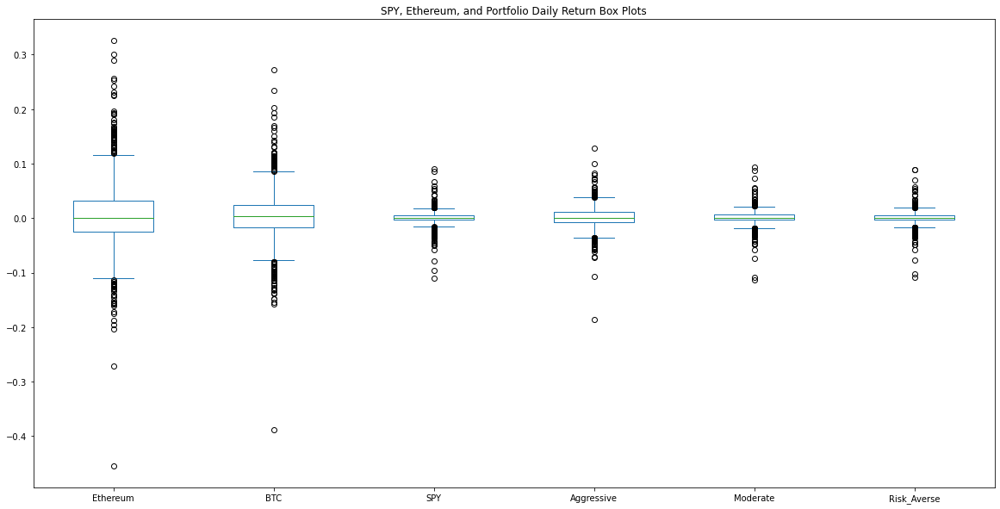

In [28]:
# Box Plot of Daily Returns 

spy_eth_btc_combo_returns.plot.box(figsize=(20, 10), title="SPY, Ethereum, and Portfolio Daily Return Box Plots") 


## Rolling 1y Volatility Plots (Using standard deviation function)

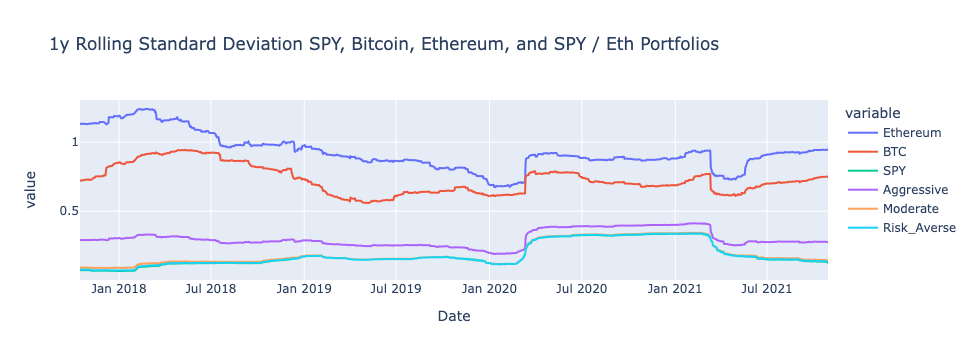

In [29]:
# SPY, Ethereum, Portfolio Rolling 1y Volatility (std)

spy_eth_btc_combo_returns_1 = spy_eth_btc_combo_returns.std() * np.sqrt(252)
spy_eth_btc_combo_returns_1 = (np.sqrt(252)*spy_eth_btc_combo_returns).rolling(window=252).std().dropna()

plotly_std = px.line(spy_eth_btc_combo_returns_1, title="1y Rolling Standard Deviation SPY, Bitcoin, Ethereum, and SPY / Eth Portfolios")
px.line(spy_eth_btc_combo_returns_1, title="1y Rolling Standard Deviation SPY, Bitcoin, Ethereum, and SPY / Eth Portfolios")

## Cumulative Return Plots

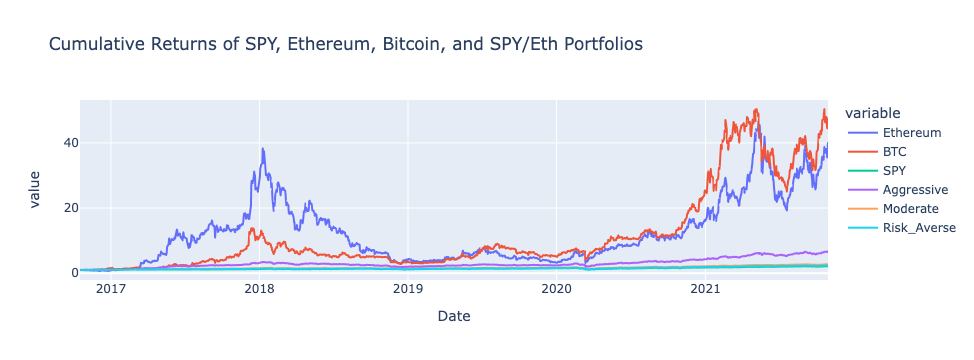

In [30]:
# Cumulative Return calculation and plot

spy_eth_btc_combo_cum_returns_1 = (1+spy_eth_btc_combo_returns).cumprod()
#spy_eth_btc_combo_cum_returns_1 = spy_eth_combo_returns).rolling(window=252).std().dropna()

plotly_cum_return = px.line(spy_eth_btc_combo_cum_returns_1, title="Cumulative Returns of SPY, Ethereum, Bitcoin, and SPY/Eth Portfolios")
px.line(spy_eth_btc_combo_cum_returns_1, title="Cumulative Returns of SPY, Ethereum, Bitcoin, and SPY/Eth Portfolios")




## Rolling 3m Beta Plots

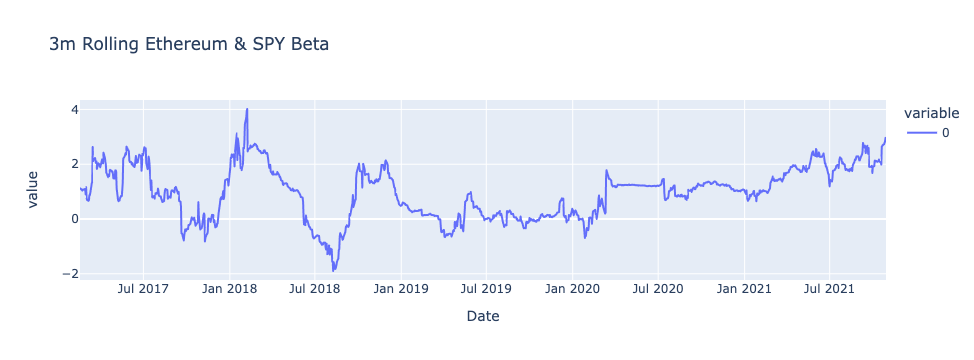

In [31]:
# Calculate Rolling 3 month Covariances against SPY

covariance_eth = spy_eth_btc_combo_returns["Ethereum"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_btc = spy_eth_btc_combo_returns["BTC"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()


covariance_aggressive= spy_eth_btc_combo_returns["Aggressive"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_moderate= spy_eth_btc_combo_returns["Moderate"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()
covariance_risk_averse= spy_eth_btc_combo_returns["Risk_Averse"].rolling(window=85).cov(spy_eth_btc_combo_returns["SPY"]).dropna()

# Calculate Rolling 3 month variance of S&P 
variance_spy = spy_eth_btc_combo_returns["SPY"].rolling(window=85).var().dropna()


# Calculate Rolling Beta

beta_eth = covariance_eth / variance_spy
beta_btc = covariance_btc / variance_spy

beta_aggressive = covariance_aggressive / variance_spy
beta_moderate = covariance_moderate / variance_spy
beta_risk_averse= covariance_risk_averse / variance_spy

# Plot selected beta trend

px.line(beta_eth, title="3m Rolling Ethereum & SPY Beta")


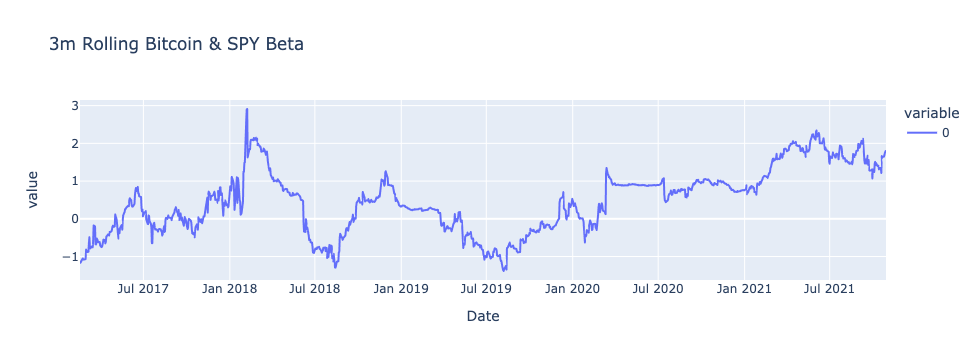

In [32]:
px.line(beta_btc, title="3m Rolling Bitcoin & SPY Beta")


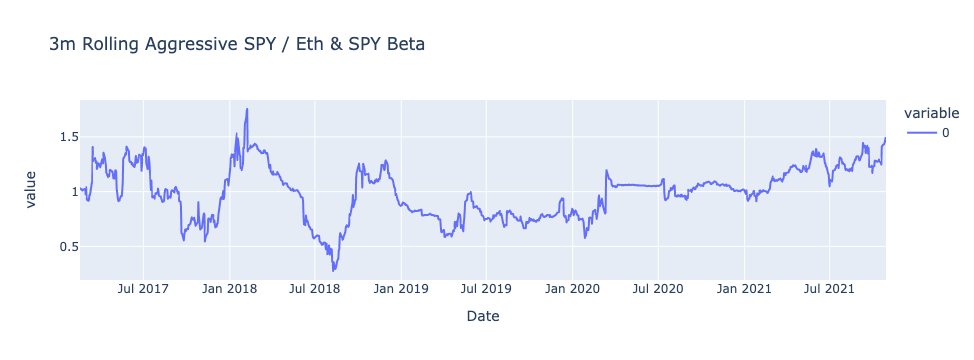

In [33]:
px.line(beta_aggressive, title="3m Rolling Aggressive SPY / Eth & SPY Beta")

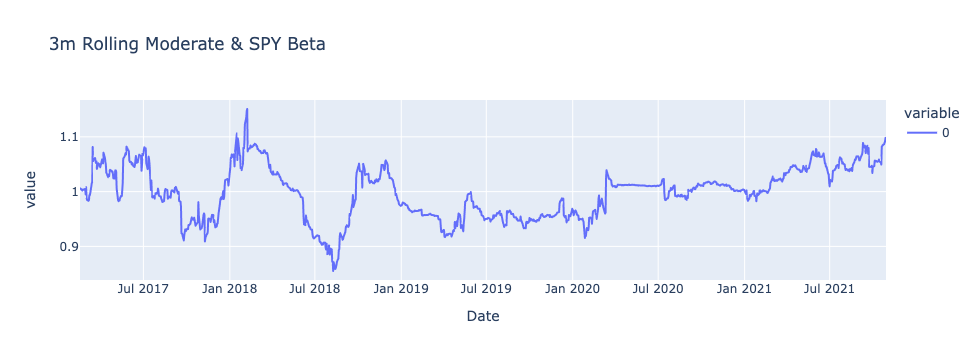

In [34]:
px.line(beta_moderate, title="3m Rolling Moderate & SPY Beta")

## ------------  1y Forward Projection - Ethereum :  Monte Carlo # 1 -----------------

In [35]:
# Create Monte Carlo function object

num_sims = 100
MC_Eth_new= MCSimulation(
    portfolio_data = eth_price_MC,
    num_simulation = num_sims,
    num_trading_days = 252*1
)

In [36]:
# Run Monte Carlo simulations to forecast one year daily returns

MC_Eth_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.996946,1.004089,1.012665,1.091719,0.957332,0.959726,0.985874,0.988310,1.040489,1.111347,...,0.979446,1.041788,0.974799,0.968122,1.032326,1.068572,0.959208,0.880934,0.976836,1.032359
2,1.020687,1.049145,1.064866,1.144734,0.921516,0.910910,0.931422,0.974151,1.076023,1.160865,...,0.912694,1.055906,0.922520,1.010548,1.042949,1.092868,0.932103,0.888874,0.981623,1.152232
3,0.986934,0.945775,1.123753,1.118436,0.979024,0.885717,0.961400,1.096179,1.079911,1.216480,...,0.925222,1.155160,0.913386,0.957446,1.011771,1.094972,0.883188,0.892147,0.960793,1.173643
4,0.963554,0.956960,1.167374,1.185174,0.987207,0.860705,0.883042,1.036992,1.064909,1.308431,...,0.840456,1.279757,0.921555,1.090931,1.119066,1.104337,0.822627,0.878355,0.986953,1.299315
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,2.998444,13.047684,4.244411,8.493347,5.101282,0.271325,1.974243,0.863850,1.394624,0.551957,...,2.124553,2.005444,4.596621,2.102520,3.202679,1.315548,17.459306,1.458846,2.188803,13.478421
249,2.675817,13.886050,4.188613,8.577942,5.421997,0.233860,2.095807,0.856549,1.414895,0.542679,...,1.941968,2.029941,4.397741,1.965998,2.865513,1.229529,18.213645,1.486194,2.193639,15.308484
250,2.871658,15.693683,4.359011,8.044185,5.596018,0.268847,2.173968,0.906237,1.303947,0.485245,...,2.032586,1.924804,4.480101,2.012004,2.843364,1.287760,17.678089,1.416286,2.060985,16.092048
251,2.796442,15.215689,4.688190,7.508391,5.214224,0.279134,2.250341,0.891948,1.304392,0.498654,...,1.962034,2.138153,5.011628,2.097388,3.000849,1.255179,17.336517,1.300337,2.145835,16.583146


In [37]:
# Compute summary statistics from the simulated daily returns

simulated_eth_returns_data = {
    "Mean": list(MC_Eth_new.simulated_return.mean(axis=1)),
    "Median": list(MC_Eth_new.simulated_return.median(axis=1)),
    "Min": list(MC_Eth_new.simulated_return.min(axis=1)),
    "Max": list(MC_Eth_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics

df_simulated_eth_returns = pd.DataFrame(simulated_eth_returns_data)

# Display sample data

df_simulated_eth_returns.head()



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,1.001699,1.008555,0.830149,1.151139
2,1.003662,1.004795,0.806979,1.203469
3,1.005284,0.996292,0.779667,1.216480
4,1.018608,1.006003,0.703769,1.308446


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior of Ethereum Over the Next Year'}>

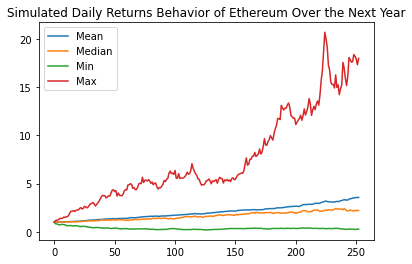

In [38]:
# Plot simulated returns over next year


df_simulated_eth_returns.plot(title="Simulated Daily Returns Behavior of Ethereum Over the Next Year")


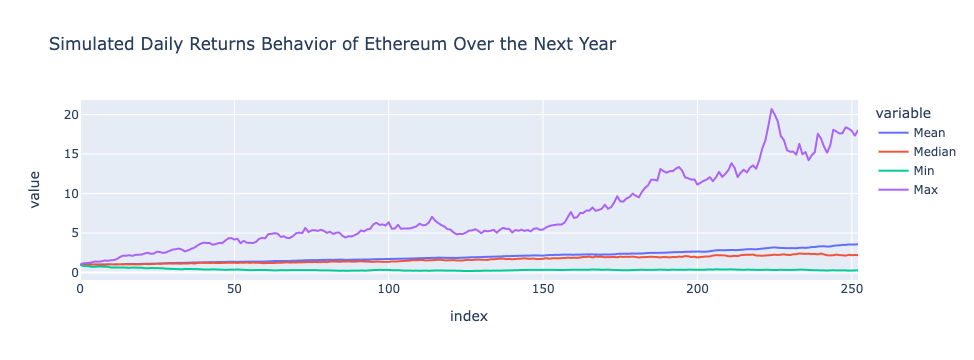

In [39]:
# Plot simulated returns over next year using plotly



px.line(df_simulated_eth_returns, title="Simulated Daily Returns Behavior of Ethereum Over the Next Year")


In [40]:
# Fetch summary statistics from the Monte Carlo simulation results

eth_tbl = MC_Eth_new.summarize_cumulative_return()

# Print summary statistics
print(eth_tbl)


count           100.000000
mean              3.565453
std               3.883829
min               0.275681
25%               1.137323
50%               2.203227
75%               4.251147
max              17.994890
95% CI Lower      0.447734
95% CI Upper     15.688217
Name: 252, dtype: float64


In [41]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Ethereum

eth_ci_lower = round(eth_tbl[8]*10000,2)
eth_ci_upper = round(eth_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in Ethereum"
      f" over the next year will end within in the range of"
      f" ${eth_ci_lower} and ${eth_ci_upper}.")


There is a 95% chance that an initial investment of $10,000 in Ethereum over the next year will end within in the range of $4477.34 and $156882.17.


In [42]:
# Set initial investment for Ethereum

eth_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

eth_cumulative_pnl = eth_initial_investment * df_simulated_eth_returns

# Display sample data
eth_cumulative_pnl.head()


,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,10016.986805,10085.551816,8301.489371,11511.390093
2,10036.620950,10047.945271,8069.790488,12034.685502
3,10052.841587,9962.924827,7796.671952,12164.804635
4,10186.078146,10060.027680,7037.694156,13084.460090


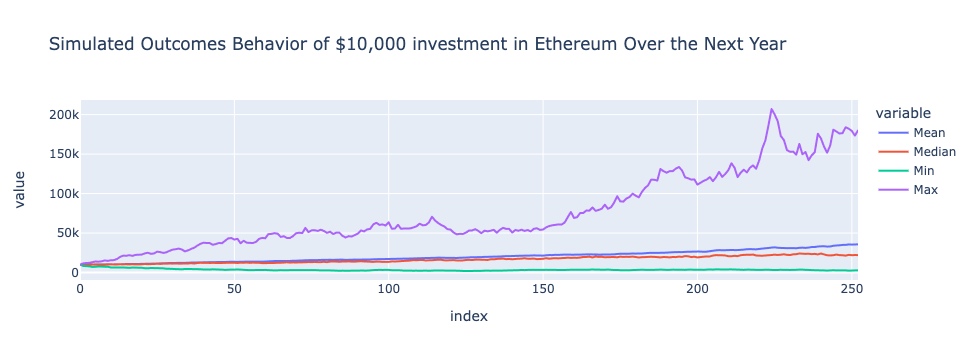

In [43]:
 # Use the 'plot' function to create a chart of the simulated profits/losses
 
MC_ETH_plot = px.line(eth_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in Ethereum Over the Next Year")
px.line(eth_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in Ethereum Over the Next Year")


## ----- 1y Forward Projection - SPY :  Monte Carlo # 2 ------------

In [44]:
# Create Monte Carlo function object for SPY

num_sims_2 = 100

MC_SPY_new= MCSimulation(
    portfolio_data = spy_price_MC,
    num_simulation = num_sims_2,
    num_trading_days = 252*1
)

In [45]:
# Run Monte Carlo simulations to forecast one year daily returns for SPY

MC_SPY_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,0.983003,1.012415,0.991115,0.994865,1.008343,0.985554,0.996156,1.016638,1.008815,1.004503,...,1.023974,0.998159,0.999675,0.998920,1.020134,1.003597,0.988872,0.999516,1.012292,0.991674
2,0.994791,1.010850,1.027063,0.976204,1.019230,0.983812,1.001816,1.010705,0.994985,1.013974,...,1.028278,1.009761,0.988567,1.007655,1.030459,0.983530,0.992500,0.992046,1.020405,1.000595
3,0.982949,1.002328,1.038073,0.951126,1.020155,0.988179,1.020148,1.012070,0.997859,1.033092,...,1.040949,1.012502,0.987024,0.996610,1.034800,0.994924,0.984747,1.013049,1.003859,0.989058
4,0.987221,0.994226,1.038517,0.969390,1.020510,1.000654,1.016510,1.018859,0.998035,1.033716,...,1.044255,1.001303,0.985416,0.996291,1.018057,1.002696,0.976243,1.013005,1.034630,0.994341
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.139911,1.160325,1.512716,0.881438,0.911150,1.270901,1.188025,1.338522,1.263739,0.932003,...,1.161142,1.014693,1.609696,1.062090,1.137249,1.252671,1.231857,0.910728,0.789158,1.076116
249,1.139544,1.178849,1.531819,0.884563,0.913087,1.281407,1.180897,1.328233,1.281156,0.940520,...,1.145383,1.028044,1.624425,1.063773,1.131462,1.264828,1.204606,0.910774,0.778918,1.077306
250,1.145777,1.193656,1.529245,0.867689,0.913673,1.273942,1.187133,1.358925,1.287345,0.939013,...,1.148027,1.041526,1.601733,1.072772,1.132795,1.256161,1.208170,0.916819,0.781869,1.069363
251,1.166168,1.194063,1.515342,0.868856,0.913519,1.278741,1.194902,1.323096,1.299994,0.931877,...,1.148917,1.041478,1.615398,1.083660,1.139674,1.251925,1.197216,0.917266,0.785076,1.068494


In [46]:
# Compute summary statistics from the simulated daily returns for SPY

simulated_spy_returns_data = {
    "Mean": list(MC_SPY_new.simulated_return.mean(axis=1)),
    "Median": list(MC_SPY_new.simulated_return.median(axis=1)),
    "Min": list(MC_SPY_new.simulated_return.min(axis=1)),
    "Max": list(MC_SPY_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics for SPY

df_simulated_spy_returns = pd.DataFrame(simulated_spy_returns_data)

# Display sample data for SPY

df_simulated_spy_returns.head(10)



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,0.999276,0.999294,0.971789,1.023974
2,0.999565,1.000360,0.944690,1.031618
3,0.998114,1.001412,0.946261,1.040949
4,1.000154,1.002405,0.932568,1.044255
5,0.999704,1.001503,0.929451,1.073470
6,1.000241,0.999665,0.909631,1.081017
7,1.000940,0.999373,0.917833,1.074551
8,0.998916,0.999924,0.919523,1.073406
9,0.998964,1.000829,0.911987,1.091928


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior of SPY Over the Next Year'}>

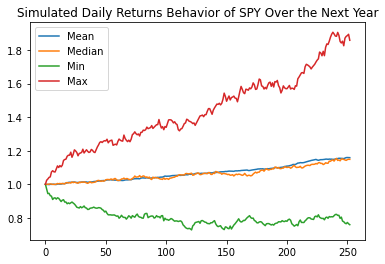

In [47]:
# Plot simulated returns over next year for SPY

df_simulated_spy_returns.plot(title="Simulated Daily Returns Behavior of SPY Over the Next Year")


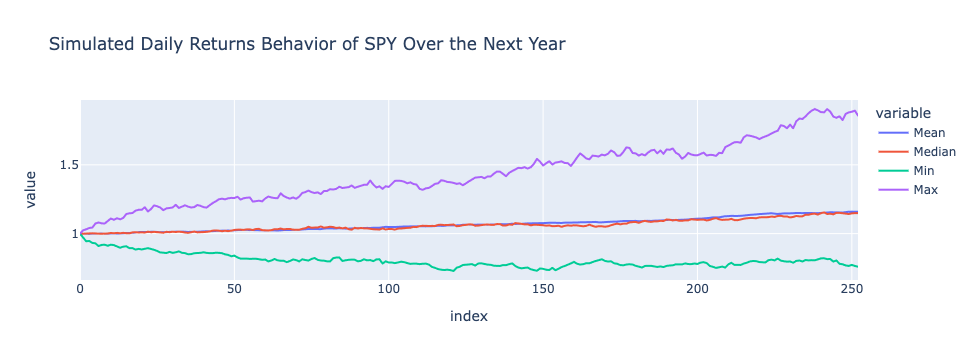

In [48]:
# Plot simulated returns over next year using plotly for SPY

px.line(df_simulated_spy_returns, title="Simulated Daily Returns Behavior of SPY Over the Next Year")



In [49]:
# Fetch summary statistics from the Monte Carlo simulation results for SPY

spy_tbl = MC_SPY_new.summarize_cumulative_return()

# Print summary statistics
print(spy_tbl)


count           100.000000
mean              1.158747
std               0.208149
min               0.759524
25%               1.018992
50%               1.148858
75%               1.264025
max               1.857952
95% CI Lower      0.824560
95% CI Upper      1.595655
Name: 252, dtype: float64


In [50]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in SPY

spy_ci_lower = round(spy_tbl[8]*10000,2)
spy_ci_upper = round(spy_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in SPY"
      f" over the next year will end within in the range of"
      f" ${spy_ci_lower} and ${spy_ci_upper}.")


There is a 95% chance that an initial investment of $10,000 in SPY over the next year will end within in the range of $8245.6 and $15956.55.


In [51]:
# Set initial investment for SPY

spy_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

spy_cumulative_pnl = spy_initial_investment * df_simulated_spy_returns

# Display sample data
spy_cumulative_pnl.head()


,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,9992.758321,9992.941191,9717.889111,10239.740597
2,9995.650474,10003.595886,9446.901186,10316.184533
3,9981.142438,10014.123171,9462.605419,10409.491777
4,10001.540209,10024.049937,9325.678420,10442.547750


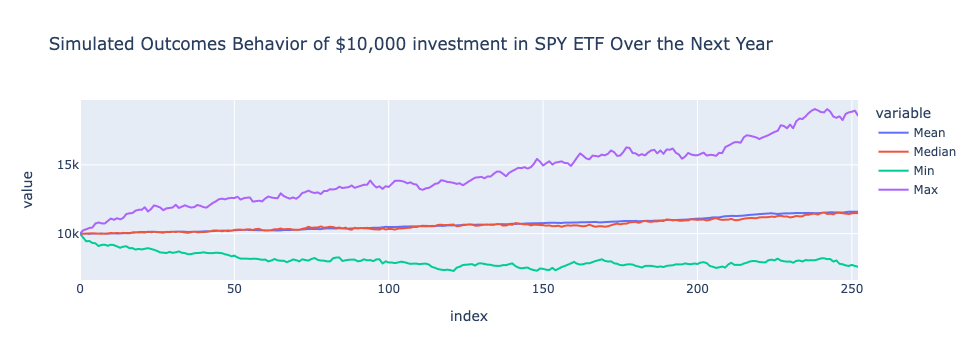

In [52]:
 # Use the 'plot' function to create a chart of the simulated profits/losses

MC_SPY_plot =  px.line(spy_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in SPY ETF Over the Next Year")
px.line(spy_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in SPY ETF Over the Next Year")



## ------------- 1y Forward Projection - Bitcoin :  Monte Carlo #3 ------------------------

In [53]:
# Create Monte Carlo function object for SPY

num_sims_3 = 100

MC_BTC_new= MCSimulation(
    portfolio_data = btc_price_MC,
    num_simulation = num_sims_3,
    num_trading_days = 252*1
)

In [54]:
# Run Monte Carlo simulations to forecast one year daily returns for SPY

MC_BTC_new.calc_cumulative_return()



Running Monte Carlo simulation number 0.
Running Monte Carlo simulation number 10.
Running Monte Carlo simulation number 20.
Running Monte Carlo simulation number 30.
Running Monte Carlo simulation number 40.
Running Monte Carlo simulation number 50.
Running Monte Carlo simulation number 60.
Running Monte Carlo simulation number 70.
Running Monte Carlo simulation number 80.
Running Monte Carlo simulation number 90.


,0,1,2,3,4,5,6,7,8,9,...,90,91,92,93,94,95,96,97,98,99
0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1,1.052509,0.975836,0.986234,0.943796,1.055633,1.069096,0.974507,0.947678,1.017281,0.950963,...,0.999776,1.037170,1.012474,1.116529,0.938599,0.952489,0.993926,0.990028,1.005348,0.961298
2,1.012367,0.969685,1.034562,0.999964,1.012238,1.056812,1.062771,0.984220,1.056023,0.946838,...,0.903905,1.036784,0.986335,1.055499,0.909787,0.957311,0.931117,0.938055,0.971093,0.931785
3,1.065564,0.996035,1.029722,0.988388,1.032271,1.016912,1.103255,1.026281,1.021913,0.882029,...,0.878782,1.067762,1.034645,1.046789,0.938679,0.988113,0.948231,0.919812,0.965969,0.859634
4,1.076472,1.031049,1.009475,1.002128,0.994576,1.007998,1.113323,0.976824,1.108220,0.925590,...,0.871410,1.051831,1.030377,1.062324,0.977566,0.982087,0.928646,0.947101,0.953194,0.876108
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248,1.434962,3.456995,0.580561,0.567050,2.932210,3.973087,3.547317,1.336236,1.173343,8.175509,...,3.500528,3.322662,1.006740,0.931818,2.069788,0.748830,0.658099,1.301972,1.337869,3.088098
249,1.301271,3.443703,0.580798,0.608447,2.943676,3.895545,3.521533,1.386091,1.163584,8.208345,...,3.499217,3.270774,1.050731,0.952190,2.053891,0.725453,0.699257,1.362368,1.290450,3.009952
250,1.278636,3.605223,0.571616,0.652672,2.926578,3.620168,3.521199,1.434641,1.178904,7.538203,...,3.444242,3.301846,1.046074,0.971553,2.158650,0.742670,0.684026,1.476950,1.255334,3.151136
251,1.283131,3.570068,0.538771,0.651567,2.993836,3.615112,3.397733,1.559995,1.190474,7.827136,...,2.988392,3.463660,1.120149,0.971005,2.306731,0.739594,0.696564,1.444582,1.223482,3.258713


In [55]:
# Compute summary statistics from the simulated daily returns for Bitcoin

simulated_btc_returns_data = {
    "Mean": list(MC_BTC_new.simulated_return.mean(axis=1)),
    "Median": list(MC_BTC_new.simulated_return.median(axis=1)),
    "Min": list(MC_BTC_new.simulated_return.min(axis=1)),
    "Max": list(MC_BTC_new.simulated_return.max(axis=1))
}

# Create a DataFrame with the summary statistics for SPY

df_simulated_btc_returns = pd.DataFrame(simulated_btc_returns_data)

# Display sample data for SPY

df_simulated_btc_returns.head(10)



,Mean,Median,Min,Max
0,1.000000,1.000000,1.000000,1.000000
1,1.000522,0.995392,0.900714,1.116529
2,0.996528,0.998782,0.866841,1.124200
3,1.004432,1.003222,0.768325,1.208396
4,1.017773,1.013423,0.745224,1.212919
5,1.019552,1.015270,0.727615,1.260956
6,1.029814,1.026711,0.716051,1.318322
7,1.029964,1.028221,0.774660,1.302008
8,1.030335,1.033680,0.728513,1.308263
9,1.038534,1.039086,0.712500,1.322913


<AxesSubplot:title={'center':'Simulated Daily Returns Behavior of Bitcoin Over the Next Year'}>

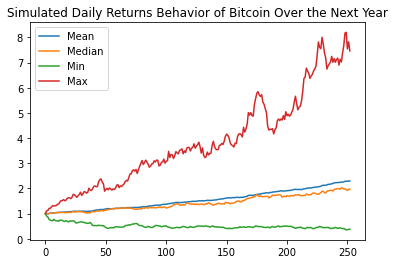

In [56]:
# Plot simulated returns over next year for BTC

df_simulated_btc_returns.plot(title="Simulated Daily Returns Behavior of Bitcoin Over the Next Year")


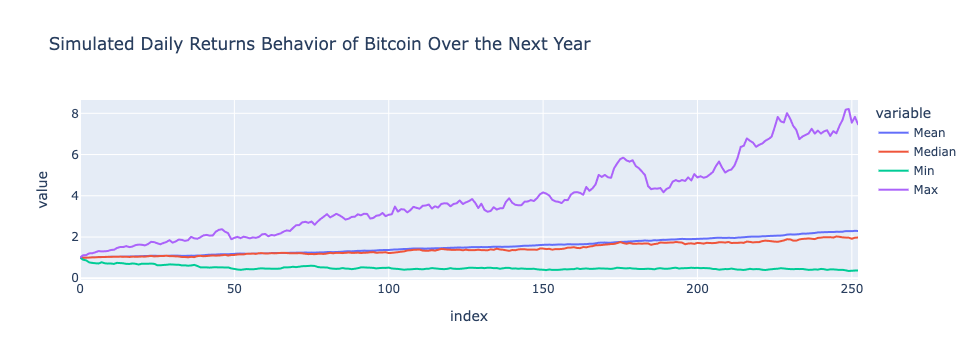

In [57]:
# Plot simulated returns over next year using plotly for Bitcoin

px.line(df_simulated_btc_returns, title="Simulated Daily Returns Behavior of Bitcoin Over the Next Year")



In [58]:
# Fetch summary statistics from the Monte Carlo simulation results for Bitcoin

btc_tbl = MC_BTC_new.summarize_cumulative_return()

# Print summary statistics
print(btc_tbl)
#df = pd.dataframe(btc_tbl)

count           100.000000
mean              2.293070
std               1.462576
min               0.378204
25%               1.270811
50%               1.976127
75%               2.807295
max               7.465573
95% CI Lower      0.498954
95% CI Upper      6.657550
Name: 252, dtype: float64


In [59]:
# Use the lower and upper `95%` confidence intervals to calculate the range of the possible outcomes of our $10,000 investments in Bitcoin

btc_ci_lower = round(btc_tbl[8]*10000,2)
btc_ci_upper = round(btc_tbl[9]*10000,2)

# Print results

print(f"There is a 95% chance that an initial investment of $10,000 in Bitcoin"
      f" over the next year will end within in the range of"
      f" ${btc_ci_lower} and ${btc_ci_upper}.")

There is a 95% chance that an initial investment of $10,000 in Bitcoin over the next year will end within in the range of $4989.54 and $66575.5.


In [60]:
# Set initial investment for Bitcoin

btc_initial_investment = 10000

# Multiply an initial investment by the daily returns of simulative stock prices to return the progression of daily returns in terms of money

btc_cumulative_pnl = btc_initial_investment * df_simulated_btc_returns

# Display sample data
btc_cumulative_pnl.head()

,Mean,Median,Min,Max
0,10000.000000,10000.000000,10000.000000,10000.000000
1,10005.220002,9953.915377,9007.138170,11165.294761
2,9965.283611,9987.818802,8668.410684,11242.002243
3,10044.318104,10032.216515,7683.248881,12083.958175
4,10177.727474,10134.234825,7452.239282,12129.186043


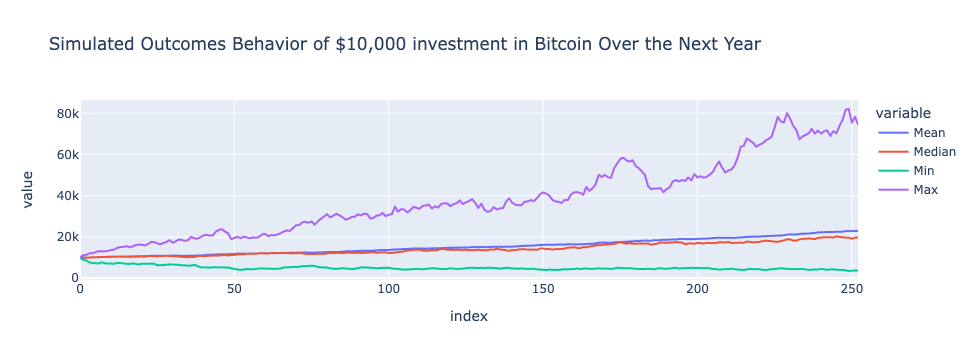

In [61]:
 # Use the 'plot' function to create a chart of the simulated profits/losses
    
    
MC_BTC_plot = px.line(btc_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in Bitcoin Over the Next Year")    
px.line(btc_cumulative_pnl, title="Simulated Outcomes Behavior of $10,000 investment in Bitcoin Over the Next Year")



# Panels / Dashboard

In [62]:


title = pn.pane.Markdown(
    """
#  Volatility of SPX500 vs Digital Assets
""",
    width=800,
)

In [63]:
tabs = pn.Tabs(
    ("Volatility Column", pn.Column( plotly_std, plotly_cum_return )),
    ("Volatility Row", pn.Row(plotly_std, plotly_cum_return )),
    ("1y Return Row", pn.Row(MC_SPY_plot, MC_BTC_plot, MC_ETH_plot))
    )
    

In [64]:
dashboard = pn.Column(pn.Row(title), tabs, width=900)

In [65]:

dashboard.servable()

Column(width=900)
    [0] Row
        [0] Markdown(str, width=800)
    [1] Tabs
        [0] Column
            [0] Plotly(Figure)
            [1] Plotly(Figure)
        [1] Row
            [0] Plotly(Figure, visible=False)
            [1] Plotly(Figure, visible=False)
        [2] Row
            [0] Plotly(Figure, visible=False)
            [1] Plotly(Figure, visible=False)
            [2] Plotly(Figure, visible=False)

In [66]:
import hvplot.pandas
df = pd.DataFrame(btc_tbl)
df.hvplot.table()

:Table   [252]